# Financial Market Volatility Prediction

## Blue jays: Xiaozhu Cao

## 1. Executive Summary

### Decisions to be impacted

The Financial Market Volatility Prediction project aimed to forecast volatility in the financial market, particularly the VIX index. This project will provide traders with actionable insights for managing market volatility. Specifically, it will optimize trading strategies, risk management and portfolio decisions.

### Business value

The project aimed to deliver business value by improving market volatility predictions accuracy, which will enable more informed decisions in volatile merkets. This will help obtain mote accurate real-time insights, reduce financial risk losses and improve decision-making returns.

### Data assets

The primary data for this project is sourced from Yahoo Finance and retrived using the Python library yfinance. Additionally, macroeconomic data is pulled from pandas_datareader and all the technical indicators are calculated from the historical price data of the respective assets using Python libraries. The data used includes a mix of market indicex, commodities, macroeconomic indicators and technical indicators.

##### 1. Market Indices

VIX(The CBOE Volatility Index): Often referred to as the "Fear Index", the VIX is a measure of market volatility, providing insight into the level of fear or stress in the stock market.

GSPC(S&P500, Standard & Poor's 500 Index): Measure the performance of 500 large-cap companies listed on U.S. stock exchanges.

IXIC(Nikkei 225): A stock market index for the Tokyo Stock Exchange(TSE), representing the performance of 225 top-rated companies listed in Japan across various industries.

DJI(Dow Jones Industrial Average): Known as the Dow 30, it tracks the stock performance of 30 prominent U.S. companies.

HSI(Hang Seng Index): A market capitalization-weighted index that follows the largest and most liquid companies on the Hong Kone Stock Exchange.

##### 2. Commoodities

DX=F(US Dollar Index): Measure of the value of the U.S. dollar against a basket of major currencies.

GC=F(Gold Futures): Futures contracts that allow the buying or selling of gold at a predetermined price on a specified future data.

CL=F(Crude Oil Futures): Standardized contracts that enable the trading of crude oil at a fixed price for a future date.

##### 3. Macroeconomic Indicators

EFFR(Effective Federal Funds Rate): Represent the interest rate at which banks lend funds to each other overnight, providing insight into montary policu and economic conditions.

##### 4. Technical Indicators

MACD(Moving average convergence divergence): MACD is a popular technical indicator that is used to identify trends and momentum in the price of a security.

ATR(Average true range): The ATR is a technical indicator that measures the volatility of a stock or other financial security.

RSI(Relatively strength index): The RSI is a technical indicator that helps traders understand if a stock or other financial instrument is over bought or oversold.

## 2. Data preprocessing

### 2.1. Data Description

The target variable for this analysis is VIX Close, which represents market volatility. The feature variables include VIX High, VIX Low, VIX Close, as well as the Close and Volume of various other economic indicators. Additionally, the remaining indicators are incorporated as extra features to build the prediction model.

The dataset spans from January 1, 2003, to January 1, 2024, covering two significant bear markets: the 2008 financial crisis and the COVID-19 pandemic in 2020. As a result, the model captures information from both bull and bear markets, offering a comprehensive view of market fluctuations over time.

#### Import Dataset and Define dataframe
In this section, I will standardize the time format and construct the dataframe for the entire project.

In [61]:
import yfinance as yf
import pandas as pd
from datetime import datetime

In [62]:
# add VIX, SP500, IXIC, DJI, HSI, DX=F, GC=F, CL=F from yfinance
start = datetime(2003, 1, 1)
end = datetime(2024, 1, 1)

tickers = "^VIX ^GSPC ^IXIC ^DJI DX=F ^HSI GC=F CL=F"
data = yf.download(tickers, start=start, end=end)

selected_data = pd.DataFrame(index=data.index)


selected_data['VIX Open'] = data['Open']['^VIX']
selected_data['VIX High'] = data['High']['^VIX']
selected_data['VIX Low'] = data['Low']['^VIX']
selected_data['VIX Close'] = data['Close']['^VIX']


for ticker in ['^GSPC', '^IXIC', '^DJI', '^HSI', 'DX=F', 'GC=F', 'CL=F']:
    if ticker in data['Close'].columns:
        selected_data[f'{ticker} Close'] = data['Close'][ticker]
        selected_data[f'{ticker} Volume'] = data['Volume'][ticker]


print(selected_data.head())

[*********************100%***********************]  8 of 8 completed

                            VIX Open   VIX High    VIX Low  VIX Close  \
Date                                                                    
2003-01-02 00:00:00+00:00  28.740000  28.740000  25.320000  25.389999   
2003-01-03 00:00:00+00:00  25.549999  25.549999  24.680000  24.680000   
2003-01-06 00:00:00+00:00  25.320000  25.420000  24.290001  24.910000   
2003-01-07 00:00:00+00:00  25.129999  25.690001  24.910000  25.129999   
2003-01-08 00:00:00+00:00  25.620001  25.760000  25.070000  25.530001   

                           ^GSPC Close  ^GSPC Volume  ^IXIC Close  \
Date                                                                
2003-01-02 00:00:00+00:00   909.030029  1.229200e+09  1384.849976   
2003-01-03 00:00:00+00:00   908.590027  1.130800e+09  1387.079956   
2003-01-06 00:00:00+00:00   929.010010  1.435900e+09  1421.319946   
2003-01-07 00:00:00+00:00   922.929993  1.545200e+09  1431.569946   
2003-01-08 00:00:00+00:00   909.929993  1.467600e+09  1401.069946   

    

In [91]:
# add macroeconomic indicators from pandas_datareader
import pandas_datareader.data as web

effr = web.DataReader('EFFR', 'fred', start, end)

macro_data = pd.concat([effr], axis=1)
macro_data.columns = ['EFFR']
print(macro_data.head())

            EFFR
DATE            
2003-01-01   NaN
2003-01-02  1.30
2003-01-03  1.12
2003-01-06  1.22
2003-01-07  1.20


In [64]:
# Check the time format
print(selected_data.index)
print(macro_data.index)

DatetimeIndex(['2003-01-02 00:00:00+00:00', '2003-01-03 00:00:00+00:00',
               '2003-01-06 00:00:00+00:00', '2003-01-07 00:00:00+00:00',
               '2003-01-08 00:00:00+00:00', '2003-01-09 00:00:00+00:00',
               '2003-01-10 00:00:00+00:00', '2003-01-13 00:00:00+00:00',
               '2003-01-14 00:00:00+00:00', '2003-01-15 00:00:00+00:00',
               ...
               '2023-12-15 00:00:00+00:00', '2023-12-18 00:00:00+00:00',
               '2023-12-19 00:00:00+00:00', '2023-12-20 00:00:00+00:00',
               '2023-12-21 00:00:00+00:00', '2023-12-22 00:00:00+00:00',
               '2023-12-26 00:00:00+00:00', '2023-12-27 00:00:00+00:00',
               '2023-12-28 00:00:00+00:00', '2023-12-29 00:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Date', length=5416, freq=None)
DatetimeIndex(['2003-01-01', '2003-01-02', '2003-01-03', '2003-01-06',
               '2003-01-07', '2003-01-08', '2003-01-09', '2003-01-10',
               '2003-01-13',

In [92]:
# Unified time format
selected_data.index = pd.to_datetime(selected_data.index).tz_localize(None)

full_data = pd.concat([selected_data, macro_data], axis=1, join='inner')

print(full_data.head())

             VIX Open   VIX High    VIX Low  VIX Close  ^GSPC Close  \
2003-01-02  28.740000  28.740000  25.320000  25.389999   909.030029   
2003-01-03  25.549999  25.549999  24.680000  24.680000   908.590027   
2003-01-06  25.320000  25.420000  24.290001  24.910000   929.010010   
2003-01-07  25.129999  25.690001  24.910000  25.129999   922.929993   
2003-01-08  25.620001  25.760000  25.070000  25.530001   909.929993   

            ^GSPC Volume  ^IXIC Close  ^IXIC Volume   ^DJI Close  ^DJI Volume  \
2003-01-02  1.229200e+09  1384.849976  1.287540e+09  8607.519531  243910000.0   
2003-01-03  1.130800e+09  1387.079956  1.149590e+09  8601.690430  234000000.0   
2003-01-06  1.435900e+09  1421.319946  1.567690e+09  8773.570312  258040000.0   
2003-01-07  1.545200e+09  1431.569946  1.755760e+09  8740.589844  266970000.0   
2003-01-08  1.467600e+09  1401.069946  1.457010e+09  8595.309570  255650000.0   

             ^HSI Close  ^HSI Volume  DX=F Close  DX=F Volume  GC=F Close  \
2003-01-0

In [93]:
# calculate and add technology indicators
import pandas_ta as ta

vix_data = yf.download('^VIX', start=start, end=end)

# MACD
macd = ta.macd(close=vix_data['Close'], fast=12, slow=26, signal=9)
# ATR
atr = ta.atr(high=vix_data['High'], low=vix_data['Low'], close=vix_data['Close'], length=14)
# RSI
rsi = ta.rsi(close=vix_data['Close'], length=14)

full_data = pd.concat([full_data, macd[['MACD_12_26_9', 'MACDs_12_26_9', 'MACDh_12_26_9']], pd.Series(atr, name='ATR'), pd.Series(rsi, name='RSI')], axis=1)
full_data = full_data.loc[:,~full_data.columns.duplicated()] # Remove Duplicate Columns

print(full_data.head())

[*********************100%***********************]  1 of 1 completed

             VIX Open   VIX High    VIX Low  VIX Close  ^GSPC Close  \
2003-01-02  28.740000  28.740000  25.320000  25.389999   909.030029   
2003-01-03  25.549999  25.549999  24.680000  24.680000   908.590027   
2003-01-06  25.320000  25.420000  24.290001  24.910000   929.010010   
2003-01-07  25.129999  25.690001  24.910000  25.129999   922.929993   
2003-01-08  25.620001  25.760000  25.070000  25.530001   909.929993   

            ^GSPC Volume  ^IXIC Close  ^IXIC Volume   ^DJI Close  ^DJI Volume  \
2003-01-02  1.229200e+09  1384.849976  1.287540e+09  8607.519531  243910000.0   
2003-01-03  1.130800e+09  1387.079956  1.149590e+09  8601.690430  234000000.0   
2003-01-06  1.435900e+09  1421.319946  1.567690e+09  8773.570312  258040000.0   
2003-01-07  1.545200e+09  1431.569946  1.755760e+09  8740.589844  266970000.0   
2003-01-08  1.467600e+09  1401.069946  1.457010e+09  8595.309570  255650000.0   

            ...  GC=F Close  GC=F Volume  CL=F Close  CL=F Volume  EFFR  \
2003-01-02 

In [67]:
print(full_data.isna().sum())

VIX Open         131
VIX High         131
VIX Low          131
VIX Close        131
^GSPC Close      131
^GSPC Volume     131
^IXIC Close      131
^IXIC Volume     131
^DJI Close       131
^DJI Volume      131
^HSI Close       239
^HSI Volume      239
DX=F Close       121
DX=F Volume      121
GC=F Close       143
GC=F Volume      143
CL=F Close       139
CL=F Volume      139
EFFR             164
MACD_12_26_9     156
MACDs_12_26_9    164
MACDh_12_26_9    164
ATR              145
RSI              145
dtype: int64


### 2.2. Data Cleaning:


Given that the models will be based on time series training, it is crucial to ensure the integrity of the data and maintain the continuity of the time series to avoid losing valuable information. To address missing values, we have chosen the forward fill method, ensuring that previous valid data is carried forward. If forward fill also results in null values, we then apply backward fill as a secondary strategy to handle the missing data effectively.

In [94]:
# If the value is NaN, then fill with the forward value, or backward if still NaN
cleaned_data = full_data.fillna(method='ffill').fillna(method='bfill')
print(cleaned_data.head())

             VIX Open   VIX High    VIX Low  VIX Close  ^GSPC Close  \
2003-01-02  28.740000  28.740000  25.320000  25.389999   909.030029   
2003-01-03  25.549999  25.549999  24.680000  24.680000   908.590027   
2003-01-06  25.320000  25.420000  24.290001  24.910000   929.010010   
2003-01-07  25.129999  25.690001  24.910000  25.129999   922.929993   
2003-01-08  25.620001  25.760000  25.070000  25.530001   909.929993   

            ^GSPC Volume  ^IXIC Close  ^IXIC Volume   ^DJI Close  ^DJI Volume  \
2003-01-02  1.229200e+09  1384.849976  1.287540e+09  8607.519531  243910000.0   
2003-01-03  1.130800e+09  1387.079956  1.149590e+09  8601.690430  234000000.0   
2003-01-06  1.435900e+09  1421.319946  1.567690e+09  8773.570312  258040000.0   
2003-01-07  1.545200e+09  1431.569946  1.755760e+09  8740.589844  266970000.0   
2003-01-08  1.467600e+09  1401.069946  1.457010e+09  8595.309570  255650000.0   

            ...  GC=F Close  GC=F Volume  CL=F Close  CL=F Volume  EFFR  \
2003-01-02 

### 2.3 Descriptive analysis

After constructing the dataframe, it consists of 5416 samples with 24 columns, including both the target variable and the feature variables.

In [69]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5416 entries, 2003-01-02 to 2023-12-29
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   VIX Open       5416 non-null   float64
 1   VIX High       5416 non-null   float64
 2   VIX Low        5416 non-null   float64
 3   VIX Close      5416 non-null   float64
 4   ^GSPC Close    5416 non-null   float64
 5   ^GSPC Volume   5416 non-null   float64
 6   ^IXIC Close    5416 non-null   float64
 7   ^IXIC Volume   5416 non-null   float64
 8   ^DJI Close     5416 non-null   float64
 9   ^DJI Volume    5416 non-null   float64
 10  ^HSI Close     5416 non-null   float64
 11  ^HSI Volume    5416 non-null   float64
 12  DX=F Close     5416 non-null   float64
 13  DX=F Volume    5416 non-null   float64
 14  GC=F Close     5416 non-null   float64
 15  GC=F Volume    5416 non-null   float64
 16  CL=F Close     5416 non-null   float64
 17  CL=F Volume    5416 non-null   flo

In [70]:
cleaned_data.describe()

,VIX Open,VIX High,VIX Low,VIX Close,^GSPC Close,^GSPC Volume,^IXIC Close,^IXIC Volume,^DJI Close,^DJI Volume,...,GC=F Close,GC=F Volume,CL=F Close,CL=F Volume,EFFR,MACD_12_26_9,MACDs_12_26_9,MACDh_12_26_9,ATR,RSI
count,5416.000000,5416.000000,5416.000000,5416.000000,5416.000000,5.416000e+03,5416.000000,5.416000e+03,5416.000000,5.416000e+03,...,5416.000000,5416.000000,5416.000000,5.416000e+03,5416.000000,5416.000000,5416.000000,5416.000000,5416.000000,5416.000000
mean,19.404775,20.315340,18.482096,19.260589,2083.228257,3.613453e+09,5322.326960,2.485670e+09,18025.043595,2.426686e+08,...,1197.372821,4974.764032,68.282415,3.279497e+05,1.478768,-0.003246,-0.001942,-0.009432,2.008112,48.815604
std,8.688363,9.314157,8.025561,8.625989,1089.551828,1.370761e+09,3970.548328,1.258084e+09,8436.870900,1.183622e+08,...,480.621035,26571.044042,23.432257,2.101565e+05,1.732913,1.366485,1.259988,0.475438,1.376304,8.564375
min,9.010000,9.310000,8.560000,9.140000,676.530029,3.560700e+08,1268.640015,2.214300e+08,6547.049805,8.410000e+06,...,321.500000,0.000000,-37.630001,0.000000e+00,0.040000,-5.450254,-4.821638,-3.881882,0.548306,24.265062
25%,13.620000,14.160000,13.080000,13.500000,1226.277527,2.864878e+09,2273.230103,1.758185e+09,11007.530029,1.514450e+08,...,828.825012,27.000000,49.720001,1.723360e+05,0.120000,-0.623616,-0.556976,-0.201681,1.183216,42.673374
50%,16.995000,17.809999,16.235000,16.910000,1647.210022,3.598250e+09,3483.505005,2.009515e+09,15087.149902,2.351750e+08,...,1252.299988,119.000000,66.225002,2.902885e+05,0.660000,-0.187697,-0.149859,0.002027,1.625080,47.405207
75%,22.432500,23.469999,21.370001,22.232500,2748.832520,4.276382e+09,7446.067505,2.486842e+09,24923.232422,3.087975e+08,...,1599.774963,426.250000,86.754999,4.222318e+05,2.292500,0.390945,0.353204,0.179919,2.364974,53.833009
max,82.690002,89.529999,72.760002,82.690002,4796.560059,1.145623e+10,16057.440430,1.162119e+10,37710.101562,9.159900e+08,...,2081.899902,386334.000000,145.289993,2.288230e+06,5.410000,14.577705,12.238768,4.024647,13.264723,91.037512


By selecting VIX Close as the target variable and plotting its trend, we can observe significant volatility around 2009 and 2021, including heightened market fear during these periods.

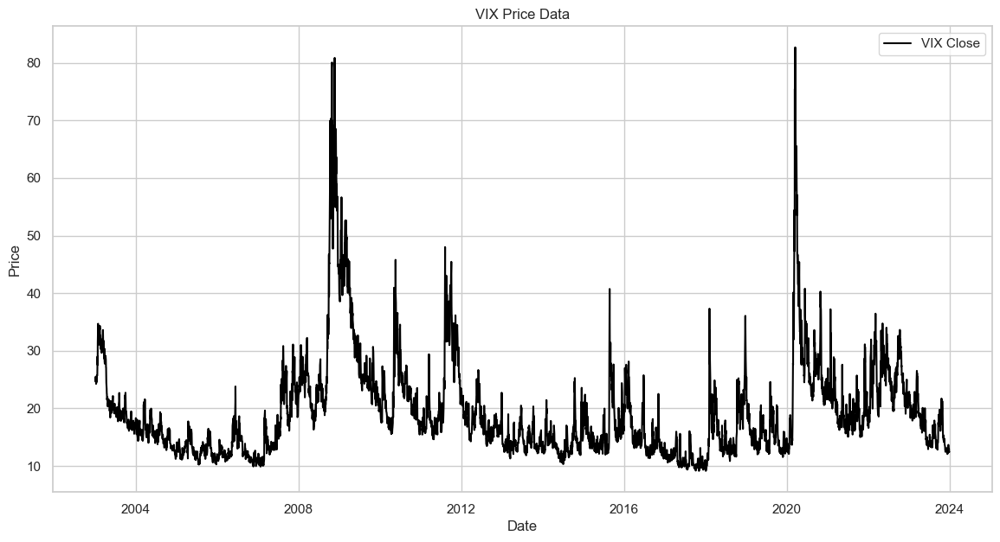

In [77]:
# plot the trend of VIX Price Data
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

plt.figure(figsize=(14, 7))
plt.plot(cleaned_data['VIX Close'], label='VIX Close', color='black')
plt.title('VIX Price Data')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Based on the histograms provided, we can draw several conclusions about the distributions of the variables:

1. The data is heavily skewed in many variables, particularly in the VIX and Volume metrics, indicating that extreme values (high volatility or volume) are rare but significant.

2. Other Indices and commodity prices have multimodal or skewed distributions, which suggests that the data spans periods of different market conditions(bull markets, bear markets).

3. Technical indicators like MACD and ATR show typical market behavior with most data around neutral conditions but occasional spikes in momentum and volatility.

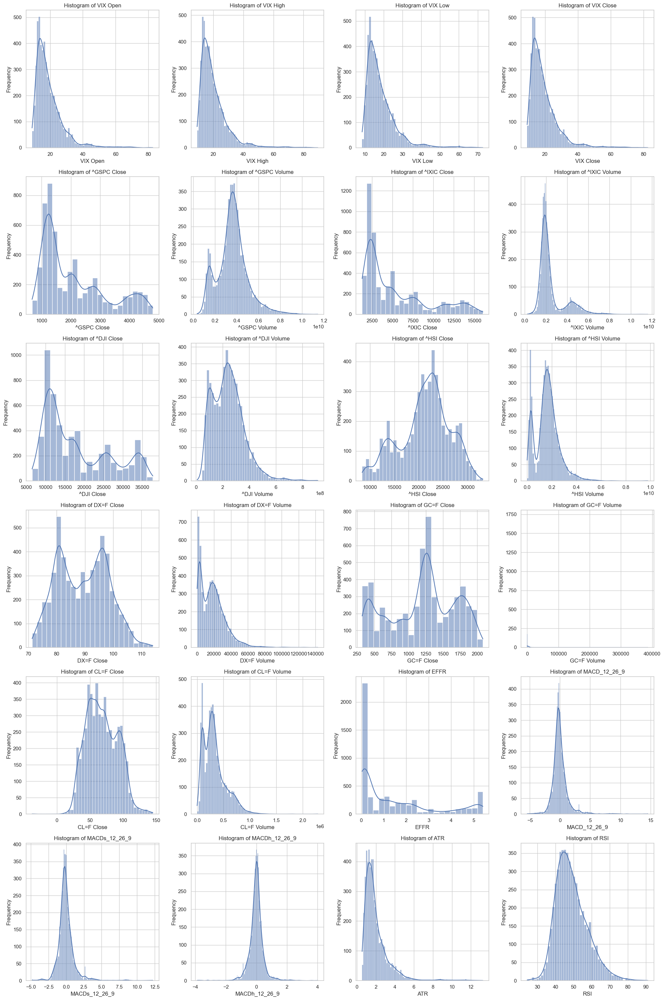

In [78]:
# Histogram
# visualize the distribution of data, identify its shape, detect outliers
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = cleaned_data.select_dtypes(include=['number']).columns
n_cols = 4
n_rows = (len(num_cols) + n_cols - 1) // n_cols

plt.figure(figsize=(20, 5 * n_rows))

for i, column in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.histplot(cleaned_data[column], kde=True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

Based on the box plots, we can identify outliers and gain insights into the data’s distribution, including its spread and central tendency

<Figure size 2000x3000 with 0 Axes>

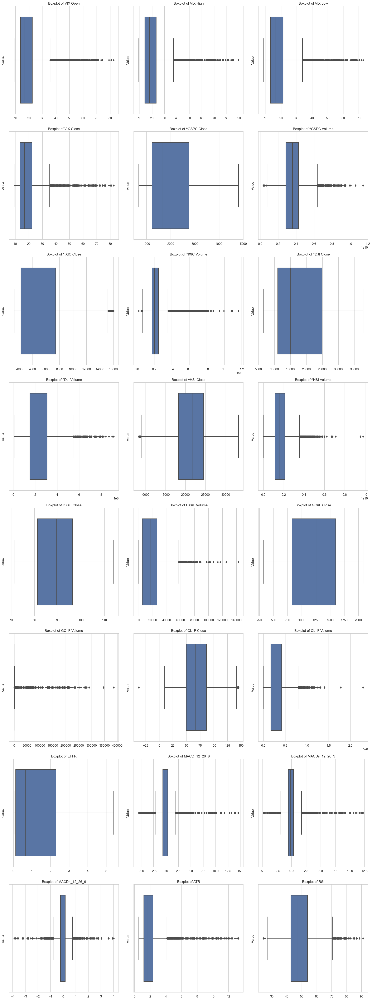

In [79]:
# Box plot
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

plt.figure(figsize=(20, 30))

num_columns = len(cleaned_data.columns)

num_rows = num_columns // 3 + 1 if num_columns % 3 != 0 else num_columns // 3

fig, axs = plt.subplots(num_rows, 3, figsize=(18, num_rows * 6))

for i, col in enumerate(cleaned_data.columns):
    ax = axs[i // 3, i % 3]
    sns.boxplot(x=cleaned_data[col], ax=ax)
    ax.set_title(f'Boxplot of {col}')
    ax.set_xlabel('')
    ax.set_ylabel('Value')

plt.tight_layout()
plt.show()

By plotting a scatter plot, we can visualize the relationship or correlation between two variables.

/Users/cecelia/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


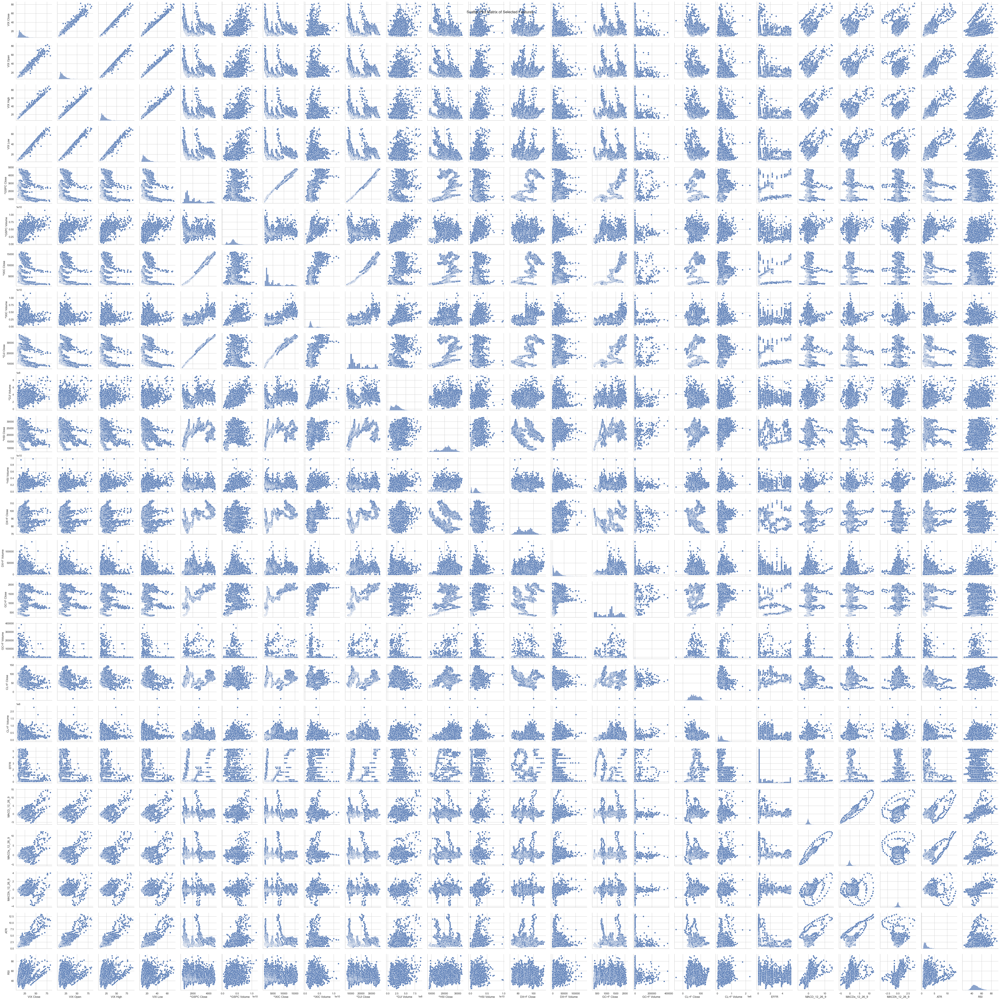

In [81]:
#Scatter plot
import seaborn as sns
import matplotlib.pyplot as plt

features = [
    'VIX Close', 'VIX Open', 'VIX High', 'VIX Low',
    '^GSPC Close', '^GSPC Volume', '^IXIC Close', '^IXIC Volume',
    '^DJI Close', '^DJI Volume', '^HSI Close', '^HSI Volume',
    'DX=F Close', 'DX=F Volume', 'GC=F Close', 'GC=F Volume',
    'CL=F Close', 'CL=F Volume', 'EFFR', 'MACD_12_26_9',
    'MACDs_12_26_9', 'MACDh_12_26_9', 'ATR', 'RSI'
]

sns.pairplot(cleaned_data[features])
plt.suptitle('Scatter Plot Matrix of Selected Features', size=16)
plt.show()

Feature correlations help identify the strength and direction of relationships between different variables.

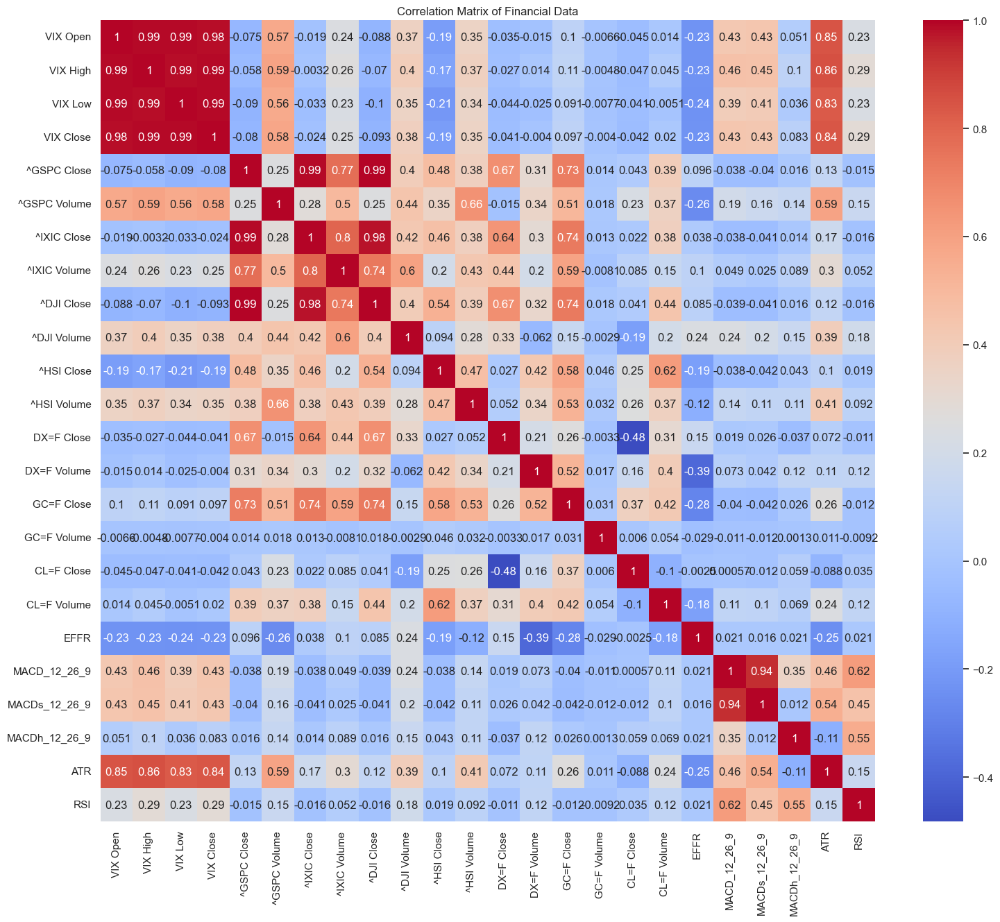

In [82]:
# Feature correlations
corr = cleaned_data.corr()

plt.figure(figsize=(18, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Financial Data')
plt.show()

### 2.4. Outlier Detection

Considering the volatility in financial markets, simply removing any feature variable could lead to the loss of valuable information. Rather than deleting features, I choose to retain all feature variables while treating outliers. This approach ensures that the model maintains as much predictive information as possible.

In the outliers detection process, IQR Method (Interquartile Range) and Isolation Forest were applied to the dataset to ensure quality data for analysis:

IQR method: It's based on statistical interquartile range (IQR) to detect outliers. It does not assume any specific data distribution, making it applicable to various types of datasets. The IQR method calculates the first quartile (Q1, 25%) and the third quartile (Q3, 75%), then computes the interquartile range (IQR = Q3 - Q1). Typically, outliers are defined as data points below Q1-1.5×IQR or above Q3+1.5×IQR.

However, since IQR is a relatively simple algorithm, I also chose the Isolation Forest algorithm, which is a tree-based anomaly detection model. 

Isolation Forest: It works by randomly selecting a feature and splitting the data at random values, isolating data points into different branches. Outliers are easier to isolate because they tend to be significantly different from other data points, resulting in their isolation after fewer splits.

In [83]:
from sklearn.ensemble import IsolationForest

# method1 - IQR method - The reason why chooses the method is that the distributions are not all normal distribution.

# calculate Q1, Q3, IQR
Q1 = cleaned_data.quantile(0.25)
Q3 = cleaned_data.quantile(0.75)
IQR = Q3 - Q1

# choose the boundary for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# detect the outliers
outliers_iqr = (cleaned_data < lower_bound) | (cleaned_data > upper_bound)

# delete outliers
cleaned_data1 = cleaned_data[~(outliers_iqr.any(axis=1))]

# method2 - Isolation Forest
iso = IsolationForest(contamination=0.05)
outliers_iso = iso.fit_predict(cleaned_data1)
cleaned_data1['is_outlier'] = outliers_iso == -1

print(cleaned_data1.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3129 entries, 2003-02-27 to 2023-11-24
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   VIX Open       3129 non-null   float64
 1   VIX High       3129 non-null   float64
 2   VIX Low        3129 non-null   float64
 3   VIX Close      3129 non-null   float64
 4   ^GSPC Close    3129 non-null   float64
 5   ^GSPC Volume   3129 non-null   float64
 6   ^IXIC Close    3129 non-null   float64
 7   ^IXIC Volume   3129 non-null   float64
 8   ^DJI Close     3129 non-null   float64
 9   ^DJI Volume    3129 non-null   float64
 10  ^HSI Close     3129 non-null   float64
 11  ^HSI Volume    3129 non-null   float64
 12  DX=F Close     3129 non-null   float64
 13  DX=F Volume    3129 non-null   float64
 14  GC=F Close     3129 non-null   float64
 15  GC=F Volume    3129 non-null   float64
 16  CL=F Close     3129 non-null   float64
 17  CL=F Volume    3129 non-null   flo

/var/folders/g6/l2ktz06j00dff_m74kcsysfr0000gn/T/ipykernel_92379/1231059582.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_data1['is_outlier'] = outliers_iso == -1


#### Split features and target



In [85]:
target = cleaned_data1['VIX Close']
features = cleaned_data1.drop(columns=['VIX Close', 'is_outlier'])

## 3. Model Updates 

### 3.1. What models you are using or planning to use to support your decision

To support the decision-making process, this project are useing these traditional econometric models and advanced machine learning models:

##### ARIMA (AutoRegressive Integrated Moving Average): 
ARIMA is a widely used statistical model for time series forecasting, aiming to capture trends and sesonality. It combines autoregression(AR), differencing(I), and moving averages(MA), making it useful for predictiong short-term market volatility based on historical patterns.

##### GARCH (Generalized Autoregressive Conditional Heteroskedasticity): 
GARCH is designed to model time-varying volatility, commonly seen in financial markets. It predicts future volatility  by accounting for past volatility and errors, making it suitable for volatility clustering in markets. GARCH is effective for modeling both long-term and short-term volatility but may struggle with more complex relationships.

##### XGBoost (Extreme Gradient Boosting): 
XGBoost is a powerful machine learning model that captures complex, non-linear relationships in data. For volatility prediction, XGBoost can incorporate a wide range of features to improve accuracy.

##### LSTM (Long Short-Term Memory): 
LSTM, a deep learning model, is used to capture long-term dependencies in time series data. In the case of VIX volatility prediction, LSTM can learn from historical data, detecting both short-term fluctuations and long-term trends, while capturing complex relationships between features.

### 3.2 Machine learning workflow as Machine Learning Morphism(MLM)

The MLM process can be broken down into the following stages:

1. Data Loading and Preprocessiong: 

The first step is to import the dataset and prepare it for modeling. This project standardizes the features and generates time series features by applying a rolling window approach to create sequences of data points for input to the model.

2. Model Training:

Train the models with initial parameters and default hyperparameters to establish baseline performance.

3. Hyperparameter Optimization with Optuna:

This step improves the performance of the LSTM and XGBoost models by turning their hyperparameters with Optuna. Optuna is an automatic hyperparameter optimization framework that uses algorithms to explores a search space and select the best parameters based on performance metrics.

4. Compare Model Performance

After training and hyperparameter optimization, this step evaluate the model's performance using key metrics. For each model, calculate evaluation metrics such MSE, RMSE, MAE, R^2, MAPE, Directional Accuracy, and Sharpe Ratio.

5. Feature Selection and Model Retraining

Using the feature importance extracted from the XGBoost model, this step selects the top 10 most important features. The dataset is then filtered to include only these top features, and both the LSTM and XGBoost models are retrained using the reduced feature set. 

6. Final Comparison and Model Selection

The final step is to compare the models' performance after retraining with selected features. Again, calculate the same evaluation metrics and compare these results with the model's original performance to assess the benefits of feature selection. Based on these comparisons, this project will select the best model and its optimized hyperparameters, which provide the highest accuracy for predicting VIX volatility.

#### Time Series Split
In time series analysis, especially when modeling and forecasting, it is very important to ensure that the training data does not leak future information. This is why when training a model on time series data, we cannot randomly split the dataset into training and test sets, as we do in general regression or classification problems.

In [86]:
# import the necessary libraries
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from arch import arch_model
from statsmodels.tsa.arima.model import ARIMA
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from xgboost import XGBRegressor
import optuna

class VIXPredictionFramework:
    def __init__(self, data, target_col='VIX Close', test_size=0.2):
        self.data = data
        self.target_col = target_col
        self.test_size = test_size
        self.models = {}
        self.results = {}

    def prepare_time_series_data(self, seq_length=10):
        """Time series data preparation, including rolling window creation"""
        # standardized data
        self.scaler = StandardScaler()
        scaled_data = self.scaler.fit_transform(self.data)

        # create a time series feature
        X, y = [], []
        for i in range(len(scaled_data) - seq_length):
            X.append(scaled_data[i:(i + seq_length)])
            y.append(scaled_data[i + seq_length, self.data.columns.get_loc(self.target_col)])

        X = np.array(X)
        y = np.array(y)

        # split train and test datasets
        train_size = int(len(X) * (1 - self.test_size))
        self.X_train, self.X_test = X[:train_size], X[train_size:]
        self.y_train, self.y_test = y[:train_size], y[train_size:]

        return self.X_train, self.X_test, self.y_train, self.y_test

    def train_garch(self, p=1, q=1):
        """train GARCH model"""
        try:
            # GARCH modeling using closing prices of raw data - write comments about how the model works
            returns = 100 * self.data[self.target_col].pct_change().dropna()
            model = arch_model(returns, p=p, q=q)
            self.models['GARCH'] = model.fit(disp='off')
            return self.models['GARCH']
        except Exception as e:
            print(f"GARCH model training failed: {str(e)}")
            return None

    def train_arima(self, order=(1,1,1)):
        """train ARIMA model"""
        try:
            model = ARIMA(self.data[self.target_col], order=order)
            self.models['ARIMA'] = model.fit()
            return self.models['ARIMA']
        except Exception as e:
            print(f"ARIMA model training failed: {str(e)}")
            return None

# Using Optuna to optimize the hyperparameters of LSTM and XGBoost models.
# Optuna iteratively optimizes the hyperparameters based on the output of the objective function,
# such as validation loss.

    def train_lstm(self, optimizer_trial=None):
        """train LSTM model, support Optuna optimization"""
        try:
            # Get hyperparameters (can be optimized via Optuna)
            if optimizer_trial:
                units = optimizer_trial.suggest_int('lstm_units', 32, 256)
                layers = optimizer_trial.suggest_int('lstm_layers', 1, 3)
                dropout = optimizer_trial.suggest_float('dropout', 0.1, 0.5)
                learning_rate = optimizer_trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
            else:
                units, layers, dropout, learning_rate = 64, 2, 0.2, 0.001

            model = Sequential()
            model.add(LSTM(units, return_sequences=True if layers > 1 else False,
                         input_shape=(self.X_train.shape[1], self.X_train.shape[2])))
            model.add(Dropout(dropout))

            for i in range(layers-2):
                model.add(LSTM(units, return_sequences=True))
                model.add(Dropout(dropout))

            if layers > 1:
                model.add(LSTM(units))
                model.add(Dropout(dropout))

            model.add(Dense(1))
            model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse')

            self.models['LSTM'] = model
            history = model.fit(self.X_train, self.y_train,
                              validation_split=0.2,
                              epochs=50,
                              batch_size=32,
                              verbose=0)
            return history
        except Exception as e:
            print(f"LSTM model training failed: {str(e)}")
            return None

    def train_xgboost(self, optimizer_trial=None):
        """train XGBoost model, support Optuna optimization"""
        try:
            if optimizer_trial:
                params = {
                    'max_depth': optimizer_trial.suggest_int('max_depth', 3, 10),
                    'learning_rate': optimizer_trial.suggest_loguniform('learning_rate', 1e-3, 1e-1),
                    'n_estimators': optimizer_trial.suggest_int('n_estimators', 100, 1000),
                    'min_child_weight': optimizer_trial.suggest_int('min_child_weight', 1, 7),
                    'subsample': optimizer_trial.suggest_float('subsample', 0.6, 1.0),
                    'colsample_bytree': optimizer_trial.suggest_float('colsample_bytree', 0.6, 1.0)
                }
            else:
                params = {
                    'max_depth': 6,
                    'learning_rate': 0.01,
                    'n_estimators': 500
                }

            model = XGBRegressor(**params)
            # Reshape data to suit XGBoost
            X_train_2d = self.X_train.reshape(self.X_train.shape[0], -1)
            X_test_2d = self.X_test.reshape(self.X_test.shape[0], -1)

            self.models['XGBoost'] = model.fit(X_train_2d, self.y_train)
            return model
        except Exception as e:
            print(f"XGBoost model training failed: {str(e)}")
            return None

    def optimize_hyperparameters(self, model_name, n_trials=100):
        """Optimizing model hyperparameters using Optuna"""
        def objective(trial):
            if model_name == 'LSTM':
                history = self.train_lstm(trial)
                return history.history['val_loss'][-1]
            elif model_name == 'XGBoost':
                model = self.train_xgboost(trial)
                X_test_2d = self.X_test.reshape(self.X_test.shape[0], -1)
                predictions = model.predict(X_test_2d)
                return mean_squared_error(self.y_test, predictions)

        study = optuna.create_study(direction='minimize')
        study.optimize(objective, n_trials=n_trials)
        return study.best_params

    def _calculate_rmse(self, y_true, y_pred):
        """Calculate Root Mean Square Error (RMSE)"""
        return np.sqrt(mean_squared_error(y_true, y_pred))

    def _calculate_mape(self, y_true, y_pred):
        """Calculate Mean Absolute Percentage Error (MAPE)"""
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

    def _calculate_directional_accuracy(self, y_true, y_pred):
        """Calculate Directional Accuracy"""
        return np.mean((np.sign(y_true[1:] - y_true[:-1]) == np.sign(y_pred[1:] - y_pred[:-1]))) * 100

    def _calculate_sharpe_ratio(self, returns, risk_free_rate=0):
        """Calculate Sharpe Ratio based on predicted returns"""
        excess_returns = returns - risk_free_rate
        return np.mean(excess_returns) / np.std(excess_returns)

    def evaluate_model(self, model_name):
        """evaluate the performance of the models"""
        try:
            y_test = self.y_test
            
            if model_name == 'GARCH':
                forecast = self.models[model_name].forecast(horizon=len(self.y_test))
                predictions = forecast.mean.values[-1]
                if len(predictions) != len(self.y_test):
                    predictions = predictions[:len(self.y_test)]
            elif model_name == 'ARIMA':
                predictions = self.models[model_name].forecast(len(self.y_test))
                if len(predictions) != len(self.y_test):
                    if len(predictions) < len(self.y_test):
                        y_test = self.y_test[:len(predictions)]
                    else:
                        predictions = predictions[:len(self.y_test)]
                        y_test = self.y_test
                else:
                    y_test = self.y_test
            elif model_name == 'LSTM':
                predictions = self.models[model_name].predict(self.X_test)
                y_test = self.y_test
            else:  # XGBoost
                X_test_2d = self.X_test.reshape(self.X_test.shape[0], -1)
                predictions = self.models[model_name].predict(X_test_2d)
                y_test = self.y_test
            
            predictions = np.array(predictions).flatten()
            y_test = np.array(y_test).flatten()
            
            min_len = min(len(predictions), len(y_test))
            predictions = predictions[:min_len]
            y_test = y_test[:min_len]
        
            # Calculating evaluation metrics
            mse = mean_squared_error(self.y_test, predictions)
            mae = mean_absolute_error(self.y_test, predictions)
            r2 = r2_score(self.y_test, predictions)
            rmse = self._calculate_rmse(self.y_test, predictions)
            mape = self._calculate_mape(self.y_test, predictions)
            direction_acc = self._calculate_directional_accuracy(self.y_test, predictions)

            # Calculate returns and Sharpe Ratio
            returns = np.diff(predictions) / predictions[:-1]
            sharpe_ratio = self._calculate_sharpe_ratio(returns)

            self.results[model_name] = {
                'mse': mse,
                'mae': mae,
                'r2': r2,
                'rmse': rmse,
                'mape': mape,
                'directional_accuracy': direction_acc,
                'sharpe_ratio': sharpe_ratio,
                'predictions': predictions
            }

            return self.results[model_name]
        except Exception as e:
            print(f"Model {model_name} evaluation failed: {str(e)}")
            return None


    def compare_models(self):
        """Comparing the performance of all models"""
        comparison = {}
        for model_name in self.models.keys():
            if model_name in self.results:
                comparison[model_name] = {
                    'MSE': self.results[model_name]['mse'],
                    'MAE': self.results[model_name]['mae'],
                    'R2': self.results[model_name]['r2'],
                    'RMSE': self.results[model_name]['rmse'],
                    'MAPE': self.results[model_name]['mape'],
                    'Directional Accuracy': self.results[model_name]['directional_accuracy'],
                    'Sharpe Ratio': self.results[model_name]['sharpe_ratio']
                }
        return comparison

    def get_best_model(self):
        """Select the best model based on MSE"""
        best_model = min(self.results.items(),
                        key=lambda x: x[1]['mse'])
        return best_model[0], best_model[1]

In [87]:
# Use the previously cleaned data
framework = VIXPredictionFramework(cleaned_data1)

# preparing time series data
X_train, X_test, y_train, y_test = framework.prepare_time_series_data()

In [88]:
# train each model
framework.train_garch()
framework.train_arima()
framework.train_lstm()
framework.train_xgboost()

/Users/cecelia/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/cecelia/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/cecelia/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/cecelia/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an 

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [89]:
# Optimizing Hyperparameters for LSTM and XGBoost
lstm_params = framework.optimize_hyperparameters('LSTM')
xgb_params = framework.optimize_hyperparameters('XGBoost')

[I 2024-10-28 22:37:42,167] A new study created in memory with name: no-name-359f8a77-a5fa-4ba4-900d-cbc1221ee40d
/var/folders/g6/l2ktz06j00dff_m74kcsysfr0000gn/T/ipykernel_92379/3595397742.py:78: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = optimizer_trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
[I 2024-10-28 22:38:17,117] Trial 0 finished with value: 0.16076798737049103 and parameters: {'lstm_units': 101, 'lstm_layers': 2, 'dropout': 0.29636609115092283, 'learning_rate': 2.827196277177358e-05}. Best is trial 0 with value: 0.16076798737049103.
[I 2024-10-28 22:39:25,296] Trial 1 finished with value: 0.2218378186225891 and parameters: {'lstm_units': 134, 'lstm_layers': 3, 'dropout': 0.17091699409111888, 'learning_rate': 4.3079342378309317e-05}. Best is trial 0 with value: 0.16076798737049103.
[I 2024-10

In [90]:
# Evaluate the performance of the models
for model_name in ['GARCH', 'ARIMA', 'LSTM', 'XGBoost']:
    framework.evaluate_model(model_name)

# Compare the performance of the models
comparison = framework.compare_models()
print("Model comparison results：")
print(comparison)

# The best model
best_model_name, best_model_results = framework.get_best_model()
print(f"The best model is: {best_model_name}")
print(f"Best model performance metrics: {best_model_results}")

 1/20 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step

/var/folders/g6/l2ktz06j00dff_m74kcsysfr0000gn/T/ipykernel_92379/3595397742.py:170: RuntimeWarning: invalid value encountered in scalar divide
  return np.mean(excess_returns) / np.std(excess_returns)
/Users/cecelia/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/cecelia/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Model comparison results：
{'GARCH': {'MSE': 1.0302063026195718, 'MAE': 0.8940561408473303, 'R2': -0.6747985069759503, 'RMSE': 1.0149907894259789, 'MAPE': 231.14549815638208, 'Directional Accuracy': 2.889245585874799, 'Sharpe Ratio': nan}, 'ARIMA': {'MSE': 298.1948817460194, 'MAE': 17.246404926380126, 'R2': -483.77313860942746, 'RMSE': 17.268320177307906, 'MAPE': 15309.306387928013, 'Directional Accuracy': 29.373996789727126, 'Sharpe Ratio': 0.18216610399888664}, 'LSTM': {'MSE': 0.14987084810785176, 'MAE': 0.28483896003940296, 'R2': 0.7563561084687533, 'RMSE': 0.3871315643393751, 'MAPE': 264.0444583606437, 'Directional Accuracy': 45.42536115569823, 'Sharpe Ratio': -0.04083422}, 'XGBoost': {'MSE': 0.08790826441632085, 'MAE': 0.21087518643781877, 'R2': 0.8570882068757165, 'RMSE': 0.2964932788720865, 'MAPE': 217.409496176735, 'Directional Accuracy': 48.95666131621188, 'Sharpe Ratio': -0.046028454}}
The best model is: XGBoost
Best model performance met

## 4. Source Code:

https://github.com/chukvho/ESE-527-project/blob/main/mid-report/midterm-code.py

## 5. Next steps:

Next, Step 5 and Step 6 will be completed: 

##### Step 5:
Using the feature importance extracted from the XGBoost model, the top 10 most important features will be selected. The dataset will then be filtered to include only these top features, and both the LSTM and XGBoost models will be retrained with the reduced feature set. 

##### Step 6:
The performance of the models after retraining will be compared by calculating the same evaluation metrics, such as MSE, RMSE, MAE, and R², and these results will be compared with the models' original performance before feature selection. This comparison will help assess the impact of feature selection. Finally, the best model and its optimized hyperparameters, which provide the highest accuracy in predicting VIX volatility, will be selected.